In [1]:
# Import necessary libraries for deep learning, data handling, and visualization
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import seaborn as sns
from tqdm import tqdm
from torchvision.utils import make_grid
import cv2
import random
import logging
import time


# Setup logging configuration for the project
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Set device (GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
logging.info(f'Using device: {device}')

# Set random seed for reproducibility
seed = 1
def seed_torch(seed):
    """Function to set the seed for reproducibility in PyTorch operations."""
    torch.manual_seed(seed)
    if torch.backends.cudnn.enabled:
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.benchmark = False  # Ensure deterministic results
        torch.backends.cudnn.deterministic = True
    logging.info(f'Random seed set to {seed}')

np.random.seed(seed)
random.seed(seed)
seed_torch(seed)



2025-01-03 17:06:44,552 - INFO - Using device: cpu
2025-01-03 17:06:44,652 - INFO - Random seed set to 1


2025-01-03 17:06:45,504 - INFO - Successfully loaded data from C:\Users\matay\Desktop\DL Project\dataset\File_Names.xlsx
Processing Images: 100%|██████████| 2416/2416 [01:07<00:00, 35.71it/s]
2025-01-03 17:07:53,189 - INFO - Image processing completed.


Image size: (2048, 1024)


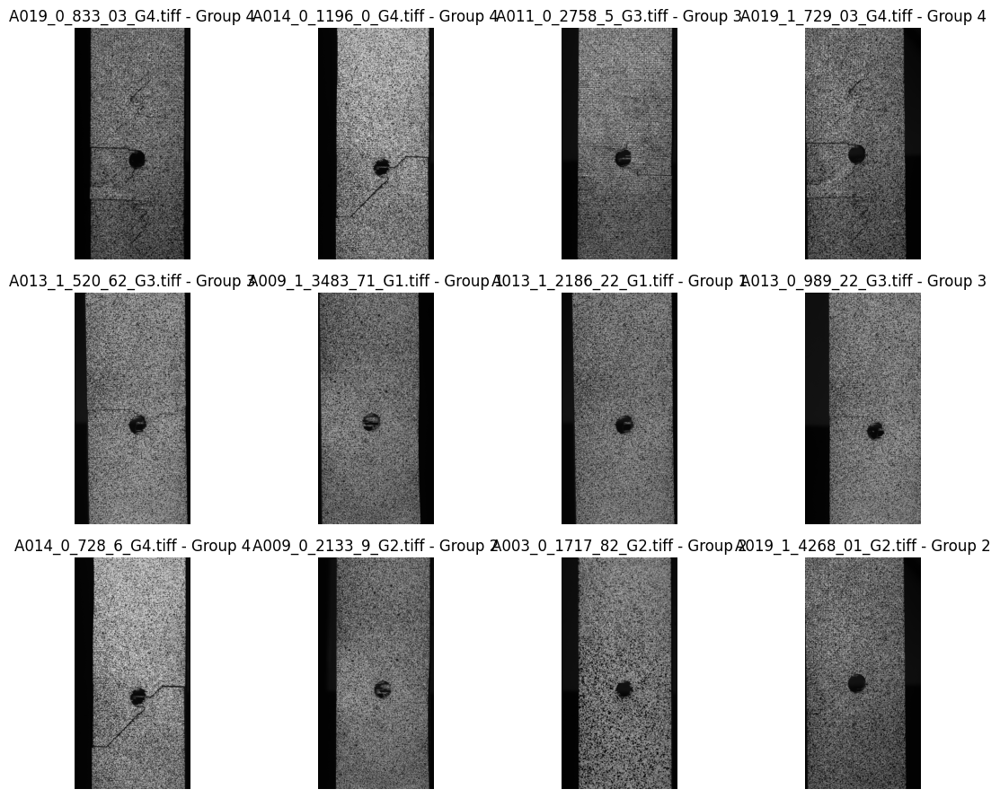

In [2]:
# Configure logging to capture important information
logging.basicConfig(level=logging.INFO, format="%(asctime)s - %(levelname)s - %(message)s")

def load_data(file_path):
    """Load data from an Excel file.

    Args:
        file_path (str): The path to the Excel file.
    
    Returns:
        pd.DataFrame: Loaded data as a pandas DataFrame.
    
    Raises:
        FileNotFoundError: If the Excel file does not exist at the given path.
    """
    if not os.path.exists(file_path):
        logging.error(f"Excel file not found: {file_path}")
        raise FileNotFoundError(f"Excel file not found: {file_path}")
    data = pd.read_excel(file_path, header=0)
    logging.info(f"Successfully loaded data from {file_path}")
    return data

def process_images(dataframe, images_dir, filename_column):
    """Process images by loading them and converting them into pixel arrays.

    Args:
        dataframe (pd.DataFrame): DataFrame containing image filenames.
        images_dir (str): Path to the directory where images are stored.
        filename_column (str): Column name containing the filenames.
    
    Returns:
        pd.DataFrame: DataFrame with an additional 'pixel_array' column.
    """
    pixel_arrays = []

    # Using tqdm for progress tracking
    for index, row in tqdm(dataframe.iterrows(), total=len(dataframe), desc="Processing Images"):
        filename = row[filename_column]
        image_path = os.path.join(images_dir, filename)

        if not os.path.exists(image_path):
            logging.warning(f"Image file not found: {image_path}. Skipping.")
            pixel_arrays.append(None)
            continue

        try:
            # Open the image and convert to grayscale
            image = Image.open(image_path).convert('L')
            pixel_arrays.append(np.array(image))
        except Exception as e:
            logging.error(f"Error processing {filename}: {e}")
            pixel_arrays.append(None)

    dataframe['pixel_array'] = pixel_arrays
    logging.info("Image processing completed.")
    return dataframe

# Paths (replace with dynamic inputs or config)
excel_path = r"C:\Users\matay\Desktop\DL Project\dataset\File_Names.xlsx"
images_dir = r"C:\Users\matay\Desktop\DL Project\dataset\ALL"

# Load the DataFrame
try:
    pic_List = load_data(excel_path)
except FileNotFoundError as e:
    logging.error("Exiting due to missing input files.")
    exit()

# Column validation
filename_column = 'File Names'
if filename_column not in pic_List.columns:
    logging.error(f"Column '{filename_column}' not found in the dataset. Exiting.")
    exit()

# Extract Group_Number from filenames
pic_List['Group_Number'] = pic_List[filename_column].str.extract(r'_G(\d)\.tiff$', expand=False)

# Process images
pic_df = process_images(pic_List, images_dir, filename_column)

def visualize_images(dataframe, num_images=12):
    """Visualize a random selection of images from the DataFrame.

    Args:
        dataframe (pd.DataFrame): DataFrame containing images and their metadata.
        num_images (int): The number of images to display.
    """
    valid_images = dataframe.dropna(subset=['pixel_array'])
    if valid_images.empty:
        logging.error("No valid images to display.")
        return

    random_indices = np.random.choice(valid_images.index, min(num_images, len(valid_images)), replace=False)
    fig, axes = plt.subplots(3, 4, figsize=(12, 9))
    axes = axes.flatten()
    for i, idx in enumerate(random_indices):
        ax = axes[i]
        image = valid_images.loc[idx, 'pixel_array']
        ax.imshow(image, cmap='gray')
        ax.set_title(f"{valid_images.loc[idx, filename_column]} - Group {valid_images.loc[idx, 'Group_Number']}")
        ax.axis('off')
    
    # Print the pixel size of one image
    print(f"Image size: {image.shape if image is not None else None}")
    
    plt.tight_layout()
    plt.show()

# Visualize images
visualize_images(pic_df)


Image size w=512 h=1024


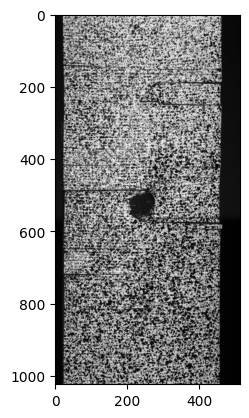

In [3]:
# Convert 'Group_Number' to integer labels (adjust labels to start from 0)
pic_df['Group_Number'] = pic_df['Group_Number'].astype(int) - 1  # Assuming group numbers start from 1 in original data

# Define the image size (Width, Height)
IMAGE_SIZE = (512, 1024)  # (Width, Height)

def preprocess_image(image_array):
    """Preprocess an image by resizing, normalizing, and expanding its dimensions.

    Args:
        image_array (np.ndarray): The image array to preprocess.
    
    Returns:
        np.ndarray: Preprocessed image with shape (1, 1024, 512).
    """
    try:
        # Convert the NumPy array to a PIL Image to allow resizing
        image = Image.fromarray(image_array)
        
        # Resize the image to the desired size (Width=512, Height=1024)
        image = image.resize(IMAGE_SIZE)
        
        # Convert back to NumPy array (shape: 1024, 512)
        image_array = np.array(image).astype(np.float32)
        
        # Normalize image pixel values to the range [0, 1]
        image_array = image_array / 255.0
        
        # Add a channel dimension for grayscale (final shape: 1, 1024, 512)
        image_array = np.expand_dims(image_array, axis=0)
        
        return image_array
    
    except Exception as e:
        logging.error(f"Error in preprocessing image: {e}")
        raise

# Apply the preprocessing function to all images in the dataset
pic_df['processed_image'] = pic_df['pixel_array'].apply(preprocess_image)

# Extract features (X) and labels (y)
X = np.stack(pic_df['processed_image'].values)
y = pic_df['Group_Number'].values

# Display the preprocessed image with the new size
plt.imshow(X[0][0], cmap='gray')
print(f"Image size w={X[0][0].shape[1]} h={X[0][0].shape[0]}")
plt.show()


In [4]:
class ImageDataset(Dataset):
    def __init__(self, images, labels):
        """
        Dataset class for loading images and their corresponding labels.
        
        Args:
            images (np.ndarray): Numpy array of shape (num_samples, 1, height, width).
            labels (np.ndarray): Numpy array of shape (num_samples,). Each label corresponds to an image.
        
        """
        # Ensure input data is in the expected format
        assert images.shape[1] == 1, "Images should have 1 channel (grayscale)"
        assert len(images) == len(labels), "Number of images and labels must be the same"
        
        self.images = images
        self.labels = labels

    def __len__(self):
        """Returns the number of samples in the dataset."""
        return len(self.images)

    def __getitem__(self, idx):
        """Fetches a single image-label pair.
        
        Args:
            idx (int): Index of the sample to fetch.
        
        Returns:
            tuple: (image, label), where image is a torch.Tensor of shape (1, height, width) and label is a torch.Tensor.
        """
        # Convert the numpy array to torch.Tensor with proper dtype for compatibility with PyTorch models
        image = torch.tensor(self.images[idx], dtype=torch.float32)
        label = torch.tensor(self.labels[idx], dtype=torch.long)  # Long type for labels (classification)
        
        return image, label


In [5]:
# Split the dataset into training and validation sets
def split_data(X, y, test_size=0.2, random_seed=1):
    """Split data into training and validation sets."""
    logging.info(f"Splitting data into training and validation sets (test_size={test_size}, random_seed={random_seed})")
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, random_state=random_seed)
    logging.info(f"Training set size: {len(X_train)}, Validation set size: {len(X_val)}")
    return X_train, X_val, y_train, y_val

# Create datasets and DataLoaders
def create_dataloaders(X_train, y_train, X_val, y_val, batch_size=16):
    """Create DataLoader objects for training and validation datasets."""
    logging.info(f"Creating DataLoader with batch_size={batch_size}")
    
    # Create the training and validation datasets
    train_dataset = ImageDataset(X_train, y_train)
    val_dataset = ImageDataset(X_val, y_val)
    
    # Create DataLoaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, drop_last=True)
    
    logging.info(f"Train DataLoader created with {len(train_loader)} batches")
    logging.info(f"Validation DataLoader created with {len(val_loader)} batches")
    
    return train_loader, val_loader

# Parameters
batch_size = 16
test_size = 0.2

# Split data
X_train, X_val, y_train, y_val = split_data(X, y, test_size=test_size, random_seed=seed)

# Create DataLoaders
train_loader, val_loader = create_dataloaders(X_train, y_train, X_val, y_val, batch_size=batch_size)


2025-01-03 17:08:19,791 - INFO - Splitting data into training and validation sets (test_size=0.2, random_seed=1)
2025-01-03 17:08:21,517 - INFO - Training set size: 1932, Validation set size: 484
2025-01-03 17:08:21,517 - INFO - Creating DataLoader with batch_size=16
2025-01-03 17:08:21,523 - INFO - Train DataLoader created with 120 batches
2025-01-03 17:08:21,525 - INFO - Validation DataLoader created with 30 batches


In [6]:
class VAE(nn.Module):
    def __init__(self, latent_dim=32):
        """
        Variational Autoencoder (VAE) model.
        
        Args:
            latent_dim (int): The dimensionality of the latent space.
        """
        super(VAE, self).__init__()
        self.latent_dim = latent_dim
        
        # --- Encoder ---
        # Input shape: [batch_size, 1, 512, 1024]
        self.enc_conv1 = nn.Conv2d(1, 16, kernel_size=4, stride=2, padding=1)  
        # -> [batch_size, 16, 256, 512]
        self.enc_conv2 = nn.Conv2d(16, 32, kernel_size=4, stride=2, padding=1) 
        # -> [batch_size, 32, 128, 256]
        self.enc_conv3 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1) 
        # -> [batch_size, 64, 64, 128]
        self.enc_conv4 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        # -> [batch_size, 128, 32, 64]

        self.flatten_dim = 128 * 64 * 32  # 262144

        self.fc_mu = nn.Linear(self.flatten_dim, latent_dim)  # Latent space mean
        self.fc_logvar = nn.Linear(self.flatten_dim, latent_dim)  # Latent space log variance

        # --- Decoder ---
        self.fc_decode = nn.Linear(latent_dim, self.flatten_dim)

        self.dec_conv1 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        # -> [batch_size, 64, 64, 128]
        self.dec_conv2 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        # -> [batch_size, 32, 128, 256]
        self.dec_conv3 = nn.ConvTranspose2d(32, 16, kernel_size=4, stride=2, padding=1)
        # -> [batch_size, 16, 256, 512]
        self.dec_conv4 = nn.ConvTranspose2d(16, 1, kernel_size=4, stride=2, padding=1)
        # -> [batch_size, 1, 512, 1024]

    def encoder(self, x):
        """
        Encoder network that processes input data into a latent space representation.
        
        Args:
            x (Tensor): Input tensor of shape [batch_size, 1, 512, 1024].
        
        Returns:
            mu (Tensor): Mean of the latent distribution.
            logvar (Tensor): Log variance of the latent distribution.
        """
        x = F.relu(self.enc_conv1(x))
        x = F.relu(self.enc_conv2(x))
        x = F.relu(self.enc_conv3(x))
        x = F.relu(self.enc_conv4(x))
        
        # Flatten the tensor to prepare for fully connected layer
        x = x.view(-1, self.flatten_dim)
        
        mu = self.fc_mu(x)       # Latent space mean
        logvar = self.fc_logvar(x)  # Latent space log variance
        return mu, logvar
    
    def reparameterize(self, mu, logvar):
        """
        Reparameterization trick to sample from the latent space.
        
        Args:
            mu (Tensor): Latent mean.
            logvar (Tensor): Log variance of the latent distribution.
        
        Returns:
            z (Tensor): Latent sample using the reparameterization trick.
        """
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)  # Standard normal noise
        return mu + eps * std  # Return latent sample
    
    def decoder(self, z):
        """
        Decoder network that reconstructs the input from the latent space representation.
        
        Args:
            z (Tensor): Latent vector of shape [batch_size, latent_dim].
        
        Returns:
            x_recon (Tensor): Reconstructed image of shape [batch_size, 1, 512, 1024].
        """
        x = self.fc_decode(z)  # [batch_size, 262144]
        x = x.view(-1, 128, 64, 32)  # Reshape to match the decoder's input
        
        x = F.relu(self.dec_conv1(x))
        x = F.relu(self.dec_conv2(x))
        x = F.relu(self.dec_conv3(x))
        x = torch.sigmoid(self.dec_conv4(x))  # Final output with sigmoid activation
        
        return x

    def forward(self, x):
        """
        Forward pass through the VAE.
        
        Args:
            x (Tensor): Input tensor of shape [batch_size, 1, 512, 1024].
        
        Returns:
            x_recon (Tensor): Reconstructed image of shape [batch_size, 1, 512, 1024].
            mu (Tensor): Mean of the latent space.
            logvar (Tensor): Log variance of the latent space.
        """
        mu, logvar = self.encoder(x)  # Get latent mean and variance
        z = self.reparameterize(mu, logvar)  # Sample from latent space
        x_recon = self.decoder(z)  # Reconstruct image from latent sample
        return x_recon, mu, logvar


In [7]:
def vae_loss_function(x_recon, x, mu, logvar, recon_weight=1.0, kld_weight=1.0, loss_type='BCE'):
    """
    VAE loss function that combines reconstruction loss and KL divergence.
    
    Args:
        x_recon (Tensor): Reconstructed image of shape (batch_size, 1, H, W).
        x (Tensor): Original image of shape (batch_size, 1, H, W).
        mu (Tensor): Mean of the latent space distribution (batch_size, latent_dim).
        logvar (Tensor): Log variance of the latent space distribution (batch_size, latent_dim).
        recon_weight (float): Weight for the reconstruction loss.
        kld_weight (float): Weight for the KL divergence loss.
        loss_type (str): Type of reconstruction loss. 'BCE' for binary cross entropy, 'MSE' for mean squared error.
        
    Returns:
        total_loss (Tensor): Combined loss (reconstruction loss + KL divergence loss).
        recon_loss (Tensor): Reconstruction loss.
        kl_loss (Tensor): KL divergence loss.
    """
    # 1) Reconstruction loss (BCE or MSE). Interpreted as -log p(x|z).
    if loss_type == 'BCE':
        recon_loss = F.binary_cross_entropy(x_recon, x, reduction='sum') / x.size(0)
    elif loss_type == 'MSE':
        recon_loss = F.mse_loss(x_recon, x, reduction='sum') / x.size(0)
    else:
        raise ValueError(f"Invalid loss_type {loss_type}. Choose either 'BCE' or 'MSE'.")
    
    # 2) KL Divergence (as per the VAE formula)
    # KL = -0.5 * sum(1 + logvar - mu^2 - exp(logvar))
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) / x.size(0)
    
    # Combine the losses
    total_loss = recon_weight * recon_loss + kld_weight * kl_loss

    return total_loss, recon_loss, kl_loss


In [8]:
# Set the latent dimension size and learning rate
latent_dim = 32
learning_rate = 1e-3

# Initialize the VAE model
model = VAE(latent_dim=latent_dim).to(device)

# Initialize the Adam optimizer
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Log the initialization of the model and optimizer
logging.info(f"VAE model initialized with latent_dim={latent_dim} and learning_rate={learning_rate}")
logging.info(f"Optimizer: Adam with learning rate = {learning_rate}")

# Optionally, log the model architecture (helps for debugging)
logging.info(f"Model architecture:\n{model}")


2025-01-03 17:08:21,884 - INFO - VAE model initialized with latent_dim=32 and learning_rate=0.001
2025-01-03 17:08:21,886 - INFO - Optimizer: Adam with learning rate = 0.001
2025-01-03 17:08:21,886 - INFO - Model architecture:
VAE(
  (enc_conv1): Conv2d(1, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (enc_conv2): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (enc_conv3): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (enc_conv4): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (fc_mu): Linear(in_features=262144, out_features=32, bias=True)
  (fc_logvar): Linear(in_features=262144, out_features=32, bias=True)
  (fc_decode): Linear(in_features=32, out_features=262144, bias=True)
  (dec_conv1): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (dec_conv2): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (dec_conv3): ConvTranspose2d(32, 16, kernel_size=(4, 4)

In [9]:

def train_one_epoch(model, dataloader, optimizer, device):
    """
    Train the model for one epoch.
    
    Args:
        model (nn.Module): The neural network model.
        dataloader (DataLoader): The data loader for the training set.
        optimizer (Optimizer): The optimizer for model parameters.
        device (torch.device): The device (CPU or GPU) for training.
        epoch (int): The current epoch number.
        log_interval (int): Number of iterations after which to log the training loss.
        
    Returns:
        avg_loss (float): Average loss over the epoch.
        avg_recon (float): Average reconstruction loss over the epoch.
        avg_kl (float): Average KL divergence loss over the epoch.
    """
    model.train()
    total_loss_accum = 0.0
    recon_loss_accum = 0.0
    kl_loss_accum = 0.0

    for batch in dataloader:
        # Unpack (images, labels), but use only images
        if isinstance(batch, (tuple, list)):
            images, _ = batch
        else:
            images = batch

        images = images.to(device)

        optimizer.zero_grad()

        # Forward pass
        x_recon, mu, logvar = model(images)
        loss, recon_loss, kl_loss = vae_loss_function(x_recon, images, mu, logvar)
        
        # Backward pass and optimizer step
        loss.backward()
        optimizer.step()

        total_loss_accum += loss.item()
        recon_loss_accum += recon_loss.item()
        kl_loss_accum += kl_loss.item()

    # Compute average per batch
    num_batches = len(dataloader)
    avg_loss  = total_loss_accum / num_batches
    avg_recon = recon_loss_accum / num_batches
    avg_kl    = kl_loss_accum   / num_batches

    return avg_loss, avg_recon, avg_kl

def evaluate(model, dataloader, device):
    """
    Evaluate the model on the validation set.
    
    Args:
        model (nn.Module): The neural network model.
        dataloader (DataLoader): The data loader for the validation set.
        device (torch.device): The device (CPU or GPU) for evaluation.
        log_interval (int): Number of iterations after which to log the evaluation loss.
        
    Returns:
        avg_loss (float): Average loss over the validation set.
        avg_recon (float): Average reconstruction loss over the validation set.
        avg_kl (float): Average KL divergence loss over the validation set.
    """
    model.eval()
    total_loss_accum = 0.0
    recon_loss_accum = 0.0
    kl_loss_accum = 0.0

    with torch.no_grad():
        for batch in dataloader:
            # Unpack (images, labels), but use only images
            if isinstance(batch, (tuple, list)):
                images, _ = batch
            else:
                images = batch

            images = images.to(device)

            # Forward pass
            x_recon, mu, logvar = model(images)
            loss, recon_loss, kl_loss = vae_loss_function(x_recon, images, mu, logvar)

            total_loss_accum += loss.item()
            recon_loss_accum += recon_loss.item()
            kl_loss_accum += kl_loss.item()

    num_batches = len(dataloader)
    avg_loss  = total_loss_accum / num_batches
    avg_recon = recon_loss_accum / num_batches
    avg_kl    = kl_loss_accum   / num_batches
    return avg_loss, avg_recon, avg_kl


In [10]:
# --- Training Loop ---
num_epochs = 20

train_total_losses = []
train_recon_losses = []
train_kl_losses    = []

val_total_losses   = []
val_recon_losses   = []
val_kl_losses      = []

for epoch in range(num_epochs):
    t_loss, t_recon, t_kl = train_one_epoch(model, train_loader, optimizer, device)
    v_loss, v_recon, v_kl = evaluate(model, val_loader, device)

    train_total_losses.append(t_loss)
    train_recon_losses.append(t_recon)
    train_kl_losses.append(t_kl)

    val_total_losses.append(v_loss)
    val_recon_losses.append(v_recon)
    val_kl_losses.append(v_kl)

    logging.info(
        f"Epoch [{epoch+1}/{num_epochs}]  "
        f"Train Loss: {t_loss:.2f}, Recon: {t_recon:.2f}, KL: {t_kl:.2f}  ||  "
        f"Val Loss: {v_loss:.2f}, Recon: {v_recon:.2f}, KL: {v_kl:.2f}"
    )

logging.info("Training completed.")


2025-01-03 17:11:29,538 - INFO - Epoch [1/20]  Train Loss: 304036.43, Recon: 303527.26, KL: 509.17  ||  Val Loss: 288335.31, Recon: 288167.51, KL: 167.79
2025-01-03 17:14:18,472 - INFO - Epoch [2/20]  Train Loss: 286236.67, Recon: 286093.25, KL: 143.43  ||  Val Loss: 285715.52, Recon: 285586.74, KL: 128.78
2025-01-03 17:17:04,185 - INFO - Epoch [3/20]  Train Loss: 284663.09, Recon: 284541.19, KL: 121.90  ||  Val Loss: 284343.17, Recon: 284221.95, KL: 121.22
2025-01-03 17:19:50,241 - INFO - Epoch [4/20]  Train Loss: 283459.37, Recon: 283333.88, KL: 125.50  ||  Val Loss: 283106.03, Recon: 282975.10, KL: 130.93
2025-01-03 17:22:32,184 - INFO - Epoch [5/20]  Train Loss: 282156.93, Recon: 282023.85, KL: 133.08  ||  Val Loss: 281922.49, Recon: 281787.14, KL: 135.35
2025-01-03 17:25:03,006 - INFO - Epoch [6/20]  Train Loss: 280911.38, Recon: 280772.27, KL: 139.11  ||  Val Loss: 280843.85, Recon: 280695.02, KL: 148.83
2025-01-03 17:27:34,264 - INFO - Epoch [7/20]  Train Loss: 279967.45, Recon:

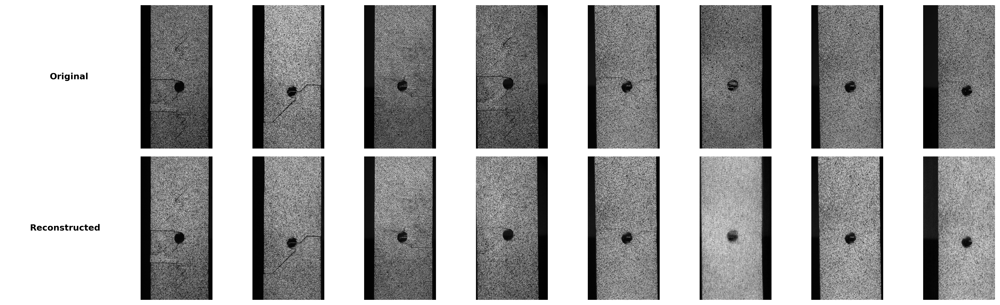

In [12]:
def visualize_reconstructions(model, dataloader, device, num_images=8):
    """
    Visualize original and reconstructed images from the dataloader with labels in front of each row.
    
    Args:
        model (nn.Module): The trained VAE model.
        dataloader (DataLoader): The dataloader for the dataset (validation or test).
        device (torch.device): The device on which the model is running (CPU or GPU).
        num_images (int): Number of images to display.
    """
    model.eval()
    images, recon_images = None, None

    with torch.no_grad():
        for batch in dataloader:
            # Unpack (images, labels) if the dataloader returns a tuple
            if isinstance(batch, (tuple, list)):
                images, _ = batch  # Ignore labels
            else:
                images = batch
            
            images = images.to(device)
            x_recon, _, _ = model(images)
            recon_images = x_recon.cpu()
            images = images.cpu()
            break  # Take just the first batch

    # Create the plot
    fig, axes = plt.subplots(2, num_images + 1, figsize=(num_images * 2.5, 6), dpi=300)
    fig.subplots_adjust(wspace=0.1, hspace=0.3)

    # Add row labels
    axes[0, 0].text(0.7, 0.5, "Original", fontsize=12, fontweight='bold', va='center', ha='right', transform=axes[0, 0].transAxes)
    axes[1, 0].text(0.8, 0.5, "Reconstructed", fontsize=12, fontweight='bold', va='center', ha='right', transform=axes[1, 0].transAxes)

    # Hide the first column axes
    axes[0, 0].axis('off')
    axes[1, 0].axis('off')

    for i in range(num_images):
        # Original Images
        axes[0, i + 1].imshow(images[i][0], cmap='gray')  # images[i] is shape (1, H, W)
        axes[0, i + 1].axis('off')

        # Reconstructed Images
        axes[1, i + 1].imshow(recon_images[i][0], cmap='gray')
        axes[1, i + 1].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage (using the validation loader)
visualize_reconstructions(model, val_loader, device, num_images=8)
